In [1]:
!pip install pytorch-ignite

In [2]:
import torch
import torchvision
import ignite

print(*map(lambda m: ": ".join((m.__name__, m.__version__)), (torch, torchvision, ignite)), sep="\n")

torch: 2.3.0
torchvision: 0.18.0
ignite: 0.5.0.post2


In [3]:
import os
import logging
import matplotlib.pyplot as plt

import numpy as np

from torchsummary import summary

import torch
import torch.nn as nn
import torch.optim as optim

import torchvision.transforms as transforms
import torchvision.utils as vutils

from ignite.engine import Engine, Events
import ignite.distributed as idist

In [4]:
from torch.utils.data import DataLoader, Subset, random_split

In [5]:
ignite.utils.manual_seed(999)

Optionally, the `logging` level `logging.WARNING` is used in internal `ignite` submodules in order to avoid internal messages.

In [6]:
ignite.utils.setup_logger(name="ignite.distributed.auto.auto_dataloader", level=logging.WARNING)
ignite.utils.setup_logger(name="ignite.distributed.launcher.Parallel", level=logging.WARNING)

<Logger ignite.distributed.launcher.Parallel (WARNING)>

In [7]:
from torchvision.datasets import ImageFolder

In [8]:
# !gdown --id 1O8LE-FpN79Diu6aCvppH5HwlcR5I--PX
# !mkdir data
# !unzip -qq img_align_celeba.zip -d data

In [9]:
import os
import glob

# Define the directory path where files have been unzipped
directory_path = r'D:\Semester 4\Deep Learning\anime'

# List all files in the directory
all_files = glob.glob(os.path.join(directory_path, '**', '*'), recursive=True)

# Print all files
print("All files:")
for file in all_files:
    print(file)

# Select specific files (e.g., only JPEG images)
jpeg_files = glob.glob(os.path.join(directory_path, '**', '*.jpg'), recursive=True)

# Print selected JPEG files
print("\nSelected JPEG files:")
for file in jpeg_files:
    print(file)

All files:
D:\Semester 4\Deep Learning\anime\images
D:\Semester 4\Deep Learning\anime\images\0_2000.jpg
D:\Semester 4\Deep Learning\anime\images\10000_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10001_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10002_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10003_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10004_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10005_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10006_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10007_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10008_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10009_2004.jpg
D:\Semester 4\Deep Learning\anime\images\1000_2000.jpg
D:\Semester 4\Deep Learning\anime\images\10010_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10011_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10012_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10013_2004.jpg
D:\Semester 4\Deep Learning\anime\images\10014_2004.jpg
D

### Dataset and transformation

The image size considered in this tutorial is `64`. Note that increase this size implies to modify the GAN models.

In [10]:
image_size = 64

data_transform = transforms.Compose(
    [
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
    ]
)

train_dataset = ImageFolder(root="./anime", transform=data_transform)

# Split dataset into train and test
test_size = int(0.2 * len(train_dataset))
train_size = len(train_dataset) - test_size
train_dataset, test_dataset = random_split(train_dataset, [train_size, test_size])

In [11]:
batch_size = 128

train_dataloader = idist.auto_dataloader(
    train_dataset, 
    batch_size=batch_size, 
    num_workers=2, 
    shuffle=True, 
    drop_last=True,
)

test_dataloader = idist.auto_dataloader(
    test_dataset, 
    batch_size=batch_size, 
    num_workers=2, 
    shuffle=False, 
    drop_last=True,
)

Let's explore the data.

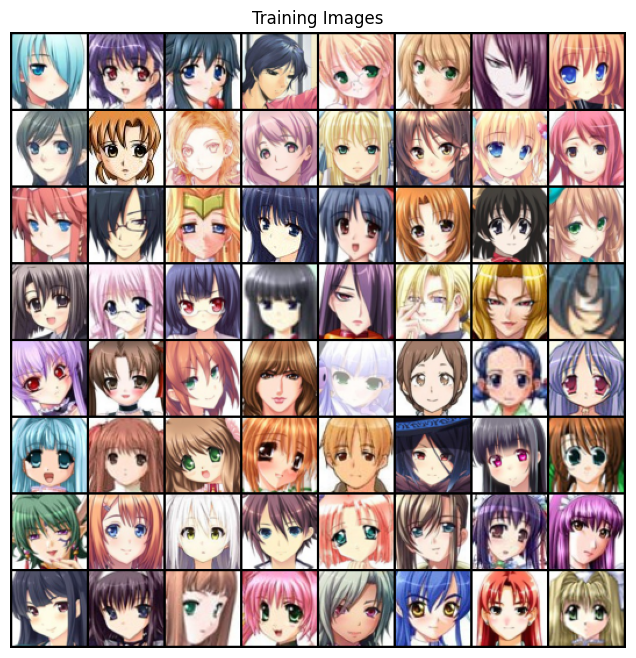

In [12]:
real_batch = next(iter(train_dataloader))

# Display the images
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:64], padding=2, normalize=True).cpu(), (1, 2, 0)))
plt.show()

In [13]:
latent_dim = 100

In [14]:
class GeneratorLAPGAN(nn.Module):
    def __init__(self, latent_dim):
        super(GeneratorLAPGAN, self).__init__()
        self.latent_dim = latent_dim

        # Initial layer
        self.initial_layer = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0, bias=False),
            nn.InstanceNorm2d(512, affine=True),
            nn.ReLU(True)
        )

        # Resolution 4x4 to 8x8
        self.layer_4_to_8 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(256, affine=True),
            nn.ReLU(True)
        )

        # Resolution 8x8 to 16x16
        self.layer_8_to_16 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(128, affine=True),
            nn.ReLU(True)
        )

        # Resolution 16x16 to 32x32
        self.layer_16_to_32 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(64, affine=True),
            nn.ReLU(True)
        )

        # Resolution 32x32 to 64x64
        self.layer_32_to_64 = nn.Sequential(
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.initial_layer(x)
        x = self.layer_4_to_8(x)
        x = self.layer_8_to_16(x)
        x = self.layer_16_to_32(x)
        x = self.layer_32_to_64(x)
        return x


In [15]:
netG = idist.auto_model(GeneratorLAPGAN(latent_dim))

In [16]:
idist.device()

device(type='cuda')

In [17]:
summary(netG, (latent_dim, 1, 1))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 512, 4, 4]           --
|    └─ConvTranspose2d: 2-1              [-1, 512, 4, 4]           819,200
|    └─InstanceNorm2d: 2-2               [-1, 512, 4, 4]           1,024
|    └─ReLU: 2-3                         [-1, 512, 4, 4]           --
├─Sequential: 1-2                        [-1, 256, 8, 8]           --
|    └─ConvTranspose2d: 2-4              [-1, 256, 8, 8]           2,097,152
|    └─InstanceNorm2d: 2-5               [-1, 256, 8, 8]           512
|    └─ReLU: 2-6                         [-1, 256, 8, 8]           --
├─Sequential: 1-3                        [-1, 128, 16, 16]         --
|    └─ConvTranspose2d: 2-7              [-1, 128, 16, 16]         524,288
|    └─InstanceNorm2d: 2-8               [-1, 128, 16, 16]         256
|    └─ReLU: 2-9                         [-1, 128, 16, 16]         --
├─Sequential: 1-4                        [-1, 64, 32, 32]      

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 512, 4, 4]           --
|    └─ConvTranspose2d: 2-1              [-1, 512, 4, 4]           819,200
|    └─InstanceNorm2d: 2-2               [-1, 512, 4, 4]           1,024
|    └─ReLU: 2-3                         [-1, 512, 4, 4]           --
├─Sequential: 1-2                        [-1, 256, 8, 8]           --
|    └─ConvTranspose2d: 2-4              [-1, 256, 8, 8]           2,097,152
|    └─InstanceNorm2d: 2-5               [-1, 256, 8, 8]           512
|    └─ReLU: 2-6                         [-1, 256, 8, 8]           --
├─Sequential: 1-3                        [-1, 128, 16, 16]         --
|    └─ConvTranspose2d: 2-7              [-1, 128, 16, 16]         524,288
|    └─InstanceNorm2d: 2-8               [-1, 128, 16, 16]         256
|    └─ReLU: 2-9                         [-1, 128, 16, 16]         --
├─Sequential: 1-4                        [-1, 64, 32, 32]      

### Discriminator

In [18]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            # input is 3 x 64 x 64
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 64 x 32 x 32
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(128, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 128 x 16 x 16
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(256, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 256 x 8 x 8
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(512, affine=True),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. 512 x 4 x 4
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.model(x)
        return x


In [19]:
netD = idist.auto_model(Discriminator())
summary(netD, (3, 64, 64))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 1, 1, 1]             --
|    └─Conv2d: 2-1                       [-1, 64, 32, 32]          3,072
|    └─LeakyReLU: 2-2                    [-1, 64, 32, 32]          --
|    └─Conv2d: 2-3                       [-1, 128, 16, 16]         131,072
|    └─InstanceNorm2d: 2-4               [-1, 128, 16, 16]         256
|    └─LeakyReLU: 2-5                    [-1, 128, 16, 16]         --
|    └─Conv2d: 2-6                       [-1, 256, 8, 8]           524,288
|    └─InstanceNorm2d: 2-7               [-1, 256, 8, 8]           512
|    └─LeakyReLU: 2-8                    [-1, 256, 8, 8]           --
|    └─Conv2d: 2-9                       [-1, 512, 4, 4]           2,097,152
|    └─InstanceNorm2d: 2-10              [-1, 512, 4, 4]           1,024
|    └─LeakyReLU: 2-11                   [-1, 512, 4, 4]           --
|    └─Conv2d: 2-12                      [-1, 1, 1, 1]      

c:\Users\fahmy\anaconda3\envs\dlgpu\lib\site-packages\torch\nn\modules\conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 1, 1, 1]             --
|    └─Conv2d: 2-1                       [-1, 64, 32, 32]          3,072
|    └─LeakyReLU: 2-2                    [-1, 64, 32, 32]          --
|    └─Conv2d: 2-3                       [-1, 128, 16, 16]         131,072
|    └─InstanceNorm2d: 2-4               [-1, 128, 16, 16]         256
|    └─LeakyReLU: 2-5                    [-1, 128, 16, 16]         --
|    └─Conv2d: 2-6                       [-1, 256, 8, 8]           524,288
|    └─InstanceNorm2d: 2-7               [-1, 256, 8, 8]           512
|    └─LeakyReLU: 2-8                    [-1, 256, 8, 8]           --
|    └─Conv2d: 2-9                       [-1, 512, 4, 4]           2,097,152
|    └─InstanceNorm2d: 2-10              [-1, 512, 4, 4]           1,024
|    └─LeakyReLU: 2-11                   [-1, 512, 4, 4]           --
|    └─Conv2d: 2-12                      [-1, 1, 1, 1]      

## Optimizers

The [Binary Cross Entropy Loss](https://pytorch.org/docs/stable/nn.html#torch.nn.BCELoss) is used in this tutorial.

In [20]:
criterion = nn.BCELoss()

A batch of `64` fixed samples will be used for generating images from throughout the training. This will allow a qualitative evaluation throughout the training progress.

In [21]:
fixed_noise = torch.randn(64, latent_dim, 1, 1, device=idist.device())

Finally, two separate optimizers are set up, one for the generator, and one for the discriminator. Yet, another helper method [`auto_optim`](https://pytorch.org/ignite/v0.4.5/generated/ignite.distributed.auto.auto_optim.html#auto-optim) provided by `idist` will help to adapt optimizer for distributed configurations. 

In [22]:
optimizerD = idist.auto_optim(
    optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
)

optimizerG = idist.auto_optim(
    optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))
)

In [23]:
real_label = 1
fake_label = 0


def training_step(engine, data):
    # Set the models for training
    netG.train()
    netD.train()

    ############################
    # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
    ###########################
    ## Train with all-real batch
    netD.zero_grad()
    # Format batch
    real = data[0].to(idist.device())
    b_size = real.size(0)
    label = torch.full((b_size,), real_label, dtype=torch.float, device=idist.device())
    # Forward pass real batch through D
    output1 = netD(real).view(-1)
    # Calculate loss on all-real batch
    errD_real = criterion(output1, label)
    # Calculate gradients for D in backward pass
    errD_real.backward()

    ## Train with all-fake batch
    # Generate batch of latent vectors
    noise = torch.randn(b_size, latent_dim, 1, 1, device=idist.device())
    # Generate fake image batch with G
    fake = netG(noise)
    label.fill_(fake_label)
    # Classify all fake batch with D
    output2 = netD(fake.detach()).view(-1)
    # Calculate D's loss on the all-fake batch
    errD_fake = criterion(output2, label)
    # Calculate the gradients for this batch, accumulated (summed) with previous gradients
    errD_fake.backward()
    # Compute error of D as sum over the fake and the real batches
    errD = errD_real + errD_fake
    # Update D
    optimizerD.step()

    ############################
    # (2) Update G network: maximize log(D(G(z)))
    ###########################
    netG.zero_grad()
    label.fill_(real_label)  # fake labels are real for generator cost
    # Since we just updated D, perform another forward pass of all-fake batch through D
    output3 = netD(fake).view(-1)
    # Calculate G's loss based on this output
    errG = criterion(output3, label)
    # Calculate gradients for G
    errG.backward()
    # Update G
    optimizerG.step()

    return {
        "Loss_G" : errG.item(),
        "Loss_D" : errD.item(),
        "D_x": output1.mean().item(),
        "D_G_z1": output2.mean().item(),
        "D_G_z2": output3.mean().item(),
    }

A `PyTorch-Ignite` engine `trainer` is defined using the above `training_step` function.

In [24]:
trainer = Engine(training_step)

### Handlers
In this section, the used `PyTorch-Ignite` handlers are introduced. These handlers will be responsible for printing out and storing important information such as losses and model predictions.

Like the DCGAN paper, we will also randomly initialize all the model weights from a Normal Distribution with `mean=0`, `stdev=0.02`. The following `initialize_fn` function must be applied to the generator and discriminator models at the start of training.

In [25]:
def initialize_fn(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('InstanceNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

The following `init_weights` handler is triggered at the start of the engine run and it is responsible for applying the `initialize_fn` function to randomly generate weights for the Generator `netD` and the Discriminator `netG`.

In [26]:
@trainer.on(Events.STARTED)
def init_weights():
    netD.apply(initialize_fn)
    netG.apply(initialize_fn)

The `store_losses` handler is responsible for storing the generator and discriminator losses in `G_losses` and `D_losses` respectively. It is triggered at the end of every iteration.

In [27]:
from ignite.handlers import Timer
timer = Timer(average=True)

@trainer.on(Events.STARTED)
def start_timer(engine):
    timer.reset()


In [28]:
G_losses = []
D_losses = []


@trainer.on(Events.ITERATION_COMPLETED)
def store_losses(engine):
    o = engine.state.output
    G_losses.append(o["Loss_G"])
    D_losses.append(o["Loss_D"])

The `store_images` handler is responsible for storing the images generated by the generator model during training. It provides us with a visual progress of the training. It is triggered every `500` iterations.

In [29]:
img_list = []


@trainer.on(Events.ITERATION_COMPLETED(every=500))
def store_images(engine):
    with torch.no_grad():
        fake = netG(fixed_noise).cpu()
    img_list.append(fake)

In [30]:
from ignite.metrics import FID, InceptionScore

The `FID` and `InceptionScore` metrics are created as the following. Here we wish to use `gpu` so we set the device to `idist.device()` but the metrics will be on `cpu` device by default if no metric is passed.

In [31]:
fid_metric = FID(device=idist.device())

In [32]:
is_metric = InceptionScore(device=idist.device(), output_transform=lambda x: x[0])

In [33]:
import PIL.Image as Image


def interpolate(batch):
    arr = []
    for img in batch:
        pil_img = transforms.ToPILImage()(img)
        resized_img = pil_img.resize((299,299), Image.BILINEAR)
        arr.append(transforms.ToTensor()(resized_img))
    return torch.stack(arr)


def evaluation_step(engine, batch):
    with torch.no_grad():
        noise = torch.randn(batch_size, latent_dim, 1, 1, device=idist.device())
        netG.eval()
        fake_batch = netG(noise)
        fake = interpolate(fake_batch)
        real = interpolate(batch[0])
        return fake, real

In [34]:
evaluator = Engine(evaluation_step)
fid_metric.attach(evaluator, "fid")
is_metric.attach(evaluator, "is")

In [35]:
fid_values = []
is_values = []


@trainer.on(Events.EPOCH_COMPLETED)
def log_training_results(engine):

    evaluator.run(test_dataloader,max_epochs=1)
    metrics = evaluator.state.metrics
    fid_score = metrics['fid']
    is_score = metrics['is']
    fid_values.append(fid_score)
    is_values.append(is_score)
    print(f"Epoch [{engine.state.epoch}/20] Metric Scores")
    print(f"*   FID : {fid_score:4f}")
    print(f"*    IS : {is_score:4f}")
    print(f"Epoch {engine.state.epoch} completed in {timer.value():.2f} seconds")


In [36]:
from ignite.metrics import RunningAverage


RunningAverage(output_transform=lambda x: x["Loss_G"]).attach(trainer, 'Loss_G')
RunningAverage(output_transform=lambda x: x["Loss_D"]).attach(trainer, 'Loss_D')

In [37]:
from ignite.contrib.handlers import ProgressBar


ProgressBar().attach(trainer, metric_names=['Loss_G','Loss_D'])
ProgressBar().attach(evaluator)

c:\Users\fahmy\anaconda3\envs\dlgpu\lib\site-packages\ignite\handlers\tqdm_logger.py:127: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [38]:
def training(*args):
    trainer.run(train_dataloader, max_epochs=20)

In [39]:
with idist.Parallel(backend='gloo') as parallel:
    parallel.run(training)

c:\Users\fahmy\anaconda3\envs\dlgpu\lib\site-packages\torch\autograd\graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [1/20] Metric Scores
*   FID : 0.067783
*    IS : 1.211847
Epoch 1 completed in 583.67 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [2/20] Metric Scores
*   FID : 0.069847
*    IS : 1.289016
Epoch 2 completed in 1216.35 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [3/20] Metric Scores
*   FID : 0.074561
*    IS : 1.367193
Epoch 3 completed in 1920.39 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [4/20] Metric Scores
*   FID : 0.067068
*    IS : 1.359633
Epoch 4 completed in 2554.95 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [5/20] Metric Scores
*   FID : 0.071690
*    IS : 1.469641
Epoch 5 completed in 3274.47 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [6/20] Metric Scores
*   FID : 0.058804
*    IS : 1.499041
Epoch 6 completed in 4017.18 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [7/20] Metric Scores
*   FID : 0.057974
*    IS : 1.656724
Epoch 7 completed in 4719.19 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [8/20] Metric Scores
*   FID : 0.035244
*    IS : 1.863405
Epoch 8 completed in 5429.71 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [9/20] Metric Scores
*   FID : 0.027478
*    IS : 1.701818
Epoch 9 completed in 6029.79 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [10/20] Metric Scores
*   FID : 0.040797
*    IS : 1.669512
Epoch 10 completed in 6600.25 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [11/20] Metric Scores
*   FID : 0.046303
*    IS : 1.831984
Epoch 11 completed in 7306.14 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [12/20] Metric Scores
*   FID : 0.036836
*    IS : 1.941220
Epoch 12 completed in 8010.17 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [13/20] Metric Scores
*   FID : 0.038385
*    IS : 1.986893
Epoch 13 completed in 8732.96 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [14/20] Metric Scores
*   FID : 0.038074
*    IS : 2.016055
Epoch 14 completed in 9442.90 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [15/20] Metric Scores
*   FID : 0.043153
*    IS : 1.903981
Epoch 15 completed in 10017.21 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [16/20] Metric Scores
*   FID : 0.035396
*    IS : 1.897909
Epoch 16 completed in 10729.39 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [17/20] Metric Scores
*   FID : 0.044751
*    IS : 1.902935
Epoch 17 completed in 11299.39 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [18/20] Metric Scores
*   FID : 0.054768
*    IS : 1.933085
Epoch 18 completed in 11889.51 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [19/20] Metric Scores
*   FID : 0.047273
*    IS : 1.927447
Epoch 19 completed in 12470.42 seconds


[1/397]   0%|           [00:00<?]

[1/99]   1%|1          [00:00<?]

Epoch [20/20] Metric Scores
*   FID : 0.035446
*    IS : 1.921178
Epoch 20 completed in 13194.17 seconds


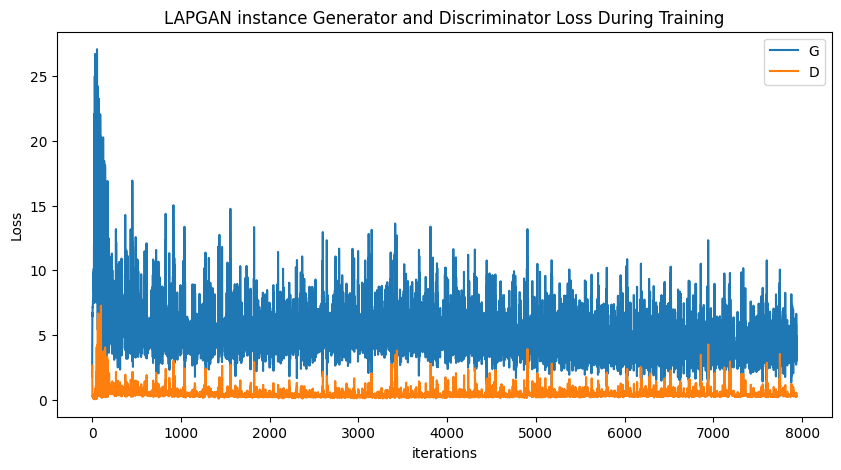

In [43]:
%matplotlib inline

plt.figure(figsize=(10,5))
plt.title("LAPGAN instance Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()

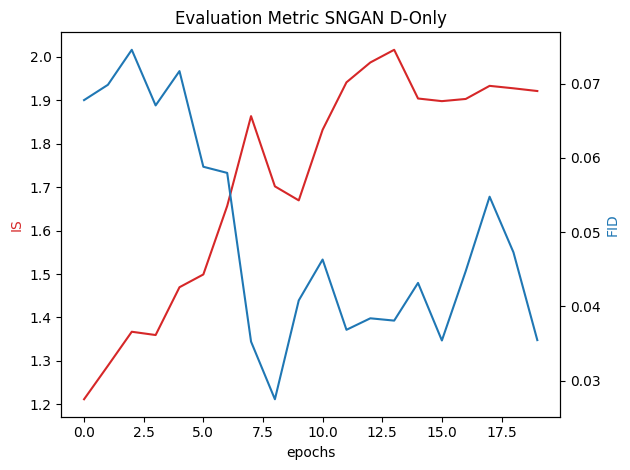

In [41]:
fig, ax1 = plt.subplots()

plt.title("Evaluation Metric SNGAN D-Only")

color = 'tab:red'
ax1.set_xlabel('epochs')
ax1.set_ylabel('IS', color=color)
ax1.plot(is_values, color=color)

ax2 = ax1.twinx()

color = 'tab:blue'
ax2.set_ylabel('FID', color=color)
ax2.plot(fid_values, color=color)

fig.tight_layout()

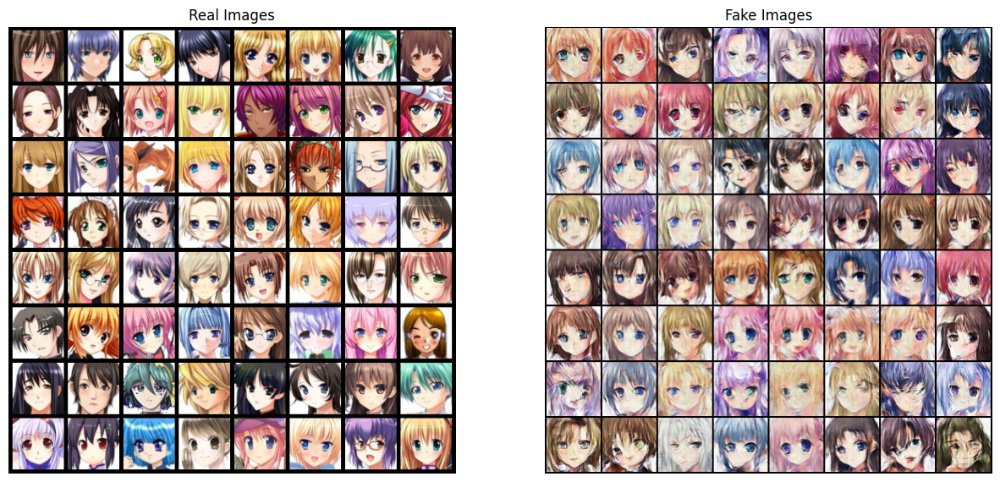

In [42]:
%matplotlib inline

# Grab a batch of real images from the dataloader
real_batch = next(iter(train_dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0][:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(vutils.make_grid(img_list[-1], padding=2, normalize=True).cpu(),(1,2,0)))